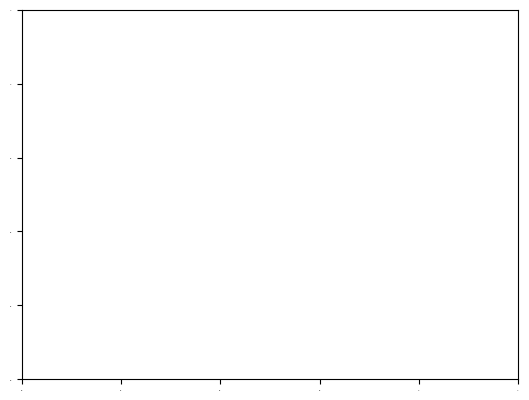

In [1]:
import os
import pandas as pd
import numpy as np
from PIL import Image
import seaborn as sns
import matplotlib.pyplot as plt
import rasterio
from rasterio.plot import show
from rasterio.warp import transform
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib_scalebar.scalebar import ScaleBar
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from pathlib import Path
from matplotlib.ticker import ScalarFormatter
from os.path import join
from shapely.geometry import box
import warnings
from shapely.ops import unary_union
from matplotlib.lines import Line2D
from rasterio.vrt import WarpedVRT
from rasterio.enums import Resampling

fontsize = 14
# plt.rcParams['font.family'] = 'serif'
plt.rcParams['xtick.labelsize'] = fontsize - 3
plt.rcParams['ytick.labelsize'] = fontsize - 3
plt.rcParams['font.size'] = fontsize
plt.rcParams['legend.fontsize'] = fontsize
plt.tick_params(axis='both', labelsize=1)

In [2]:
manual_label_dir = "/net/data_ssd/tree_mortality_orthophotos/labels_and_aois/"
orthophoto_dir = "/net/data_ssd/tree_mortality_orthophotos/unlabeled_orthophotos/"
prediction_label_dir = "/net/data_ssd/tree_mortality_orthophotos/deadwood_segmentation_predictions_full_120/"

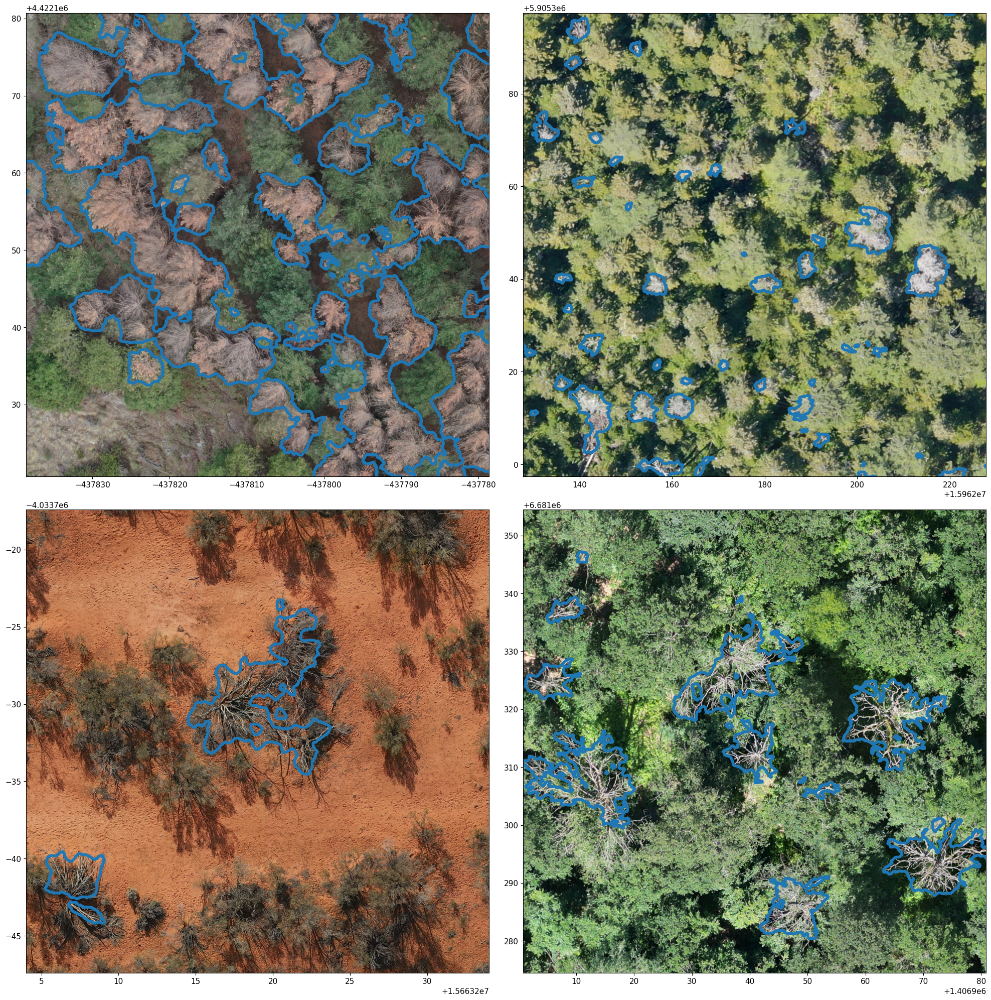

In [3]:
# orthophoto_base_names = ["spain_17_09_2023_resin_5_ortho", "20240624_mavic3e_feldberg_f1", "sakhalin4", "iranmojdeh_2", "20220519_SASMDD0014_p1_ortho_01_cog", "cyclewest_08_06_2024_1"]
# project_ids = ["spain", "tejasendsit", "kirillasia", "iranmojdeh", "australiatern", "cyclewest"]
# bls = [(36.87803986, -3.93317126), (47.8723138, 8.0286604), (5182848, 682479.806), (3803576, 625023), (6233722, 472765), (51.33785, 12.63840539)]
# extents = [0.001, 0.001, 50, 20, 20, 0.0005]

orthophoto_base_names = ["spain_17_09_2023_resin_5_ortho", "sakhalin4", "20220519_SASMDD0014_p1_ortho_01_cog", "cyclewest_08_06_2024_1"]
project_ids = ["spain", "kirillasia", "australiatern", "cyclewest"]
bls = [(36.87803986, -3.93317126), (5182848, 682479.806), (6233722, 472765), (51.33785, 12.63840539)]
extents = [60, 100, 30, 80]

# "uavforsat_FIN003_ortho" (60.223928052, 24.910386108), 0.0005
# "uavforsat_FIN003_ortho", (60.2232, 24.914030093), 0.00068366,

fig, axes = plt.subplots(ncols=2, nrows=2 ,figsize=(20,20))

plot_crs = "EPSG:3857"

for basename, project_id, bl, extent, ax in zip(orthophoto_base_names, project_ids, bls, extents, axes.flatten()):
    orthophoto_path = join(orthophoto_dir, project_id, basename + ".tif")
    prediction_path = join(prediction_label_dir, basename + "_prediction.gpkg")

    with rasterio.open(orthophoto_path) as dr:
        with WarpedVRT(dr, crs=plot_crs, resampling=Resampling.bilinear) as vrt:
            
            prediction = gpd.read_file(prediction_path).to_crs(plot_crs).buffer(0)

            blt = transform(dr.crs, plot_crs, [bl[1]], [bl[0]])

            # reproject bounds box dr.crs to plot_crs
            # bounds_box = transform_bounds(dr.crs, plot_crs, *bounds_box.bounds)
            bounds_box = (blt[0][0], blt[1][0], blt[0][0] + extent, blt[1][0] + extent)

            ax.set_xlim((bounds_box[0], bounds_box[2]))
            ax.set_ylim((bounds_box[1], bounds_box[3]))
            
            # ax.set_ylim((bl[0], bl[0] + extent))
            # ax.set_xlim((bl[1], bl[1] + extent))
            
            win = vrt.window(*bounds_box) 
            ax.imshow(np.moveaxis(vrt.read(window=win), 0, -1), extent=[bounds_box[0], bounds_box[2], bounds_box[1], bounds_box[3]], vmin=0, vmax=255)
            
            # win = vrt.window(bl[1], bl[0], bl[1] + extent, bl[0] + extent) 
            # ax.imshow(np.moveaxis(vrt.read(window=win), 0, -1), extent=[bl[1], bl[1] + extent, bl[0], bl[0] + extent], vmin=0, vmax=255)
            
            prediction.boundary.plot(ax=ax, color="#1f77b4", lw=4, alpha=1)
        
            ax.set_aspect("equal")
            # ax.set_ylabel("Latitude [deg]")
            # ax.set_xlabel("Longitude [deg]")

fig.subplots_adjust(hspace=0, wspace=0.1)
fig.tight_layout()
fig.savefig("/net/home/cmosig/projects/standing-deadwood/plots/sample_prediction_plot.pdf", bbox_inches="tight")